In [0]:
import cv2
import numpy as np
import operator
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

In [0]:
def HarrisCorner(image):
    arr = cv2.imread(image)
    
    
    fig = plt.figure(figsize=(10,5))
    plt.imshow(cv2.cvtColor(arr, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    arr = cv2.cvtColor(arr, cv2.COLOR_BGR2GRAY)
    print('size:{}'.format(arr.shape))

    gker=5
    sker=3
    # gray = cv2.GaussianBlur(arr, (gker, gker), 0)

    gray =arr
    grad_x = cv2.Sobel(gray,cv2.CV_32F, 1, 0, ksize=sker, borderType=cv2.BORDER_DEFAULT)
    grad_y = cv2.Sobel(gray,cv2.CV_32F, 0, 1, ksize=sker, borderType=cv2.BORDER_DEFAULT)

    titles = ['Ix', 'Iy']
    fig = plt.figure(figsize=(20,8))
    for i, val in enumerate([grad_x, grad_y]):
      test = fig.add_subplot(1, 2, i + 1)
      test.imshow(cv2.cvtColor(val, cv2.COLOR_BGR2RGB))
      test.set_title(titles[i])
    fig.tight_layout()
    plt.axis('off')
    plt.show()

    sq_grad_x = np.square(grad_x)
    sq_grad_y = np.square(grad_y)
    grad_xy = grad_x * grad_y

    titles = ['Ix^2', 'Iy^2', 'IxIy']
    fig = plt.figure(figsize=(20,10))
    for i, val in enumerate([sq_grad_x, sq_grad_y, grad_xy]):
      test = fig.add_subplot(1, 3, i + 1)
      test.imshow(cv2.cvtColor(val, cv2.COLOR_BGR2RGB))
      test.set_title(titles[i])
    fig.tight_layout()
    plt.axis('off')
    plt.show()

    Gsq_grad_x = cv2.GaussianBlur(sq_grad_x, (gker, gker), 1)
    Gsq_grad_y = cv2.GaussianBlur(sq_grad_y, (gker, gker), 1)
    Ggrad_xy = cv2.GaussianBlur(grad_xy, (gker, gker), 1)

    titles = ['g(Ix^2)', 'g(Iy^2)', 'g(IxIy)']
    fig = plt.figure(figsize=(20,10))
    for i, val in enumerate([Gsq_grad_x, Gsq_grad_y, Ggrad_xy]):
      test = fig.add_subplot(1, 3, i + 1)
      test.imshow(cv2.cvtColor(val, cv2.COLOR_BGR2RGB))
      test.set_title(titles[i])
    fig.tight_layout()
    plt.axis('off')
    plt.show()

    a = 0.04
    detM = Gsq_grad_x * Gsq_grad_y - np.square(Ggrad_xy)
    traceM = Gsq_grad_x + Gsq_grad_y
    har = detM - a * np.square(traceM)

    fig = plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(har, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    print('size:{}'.format(har.shape))

    # thresh = 500000000
    # cornerList = []
    # edgelist = []
    carr = cv2.imread(image)
    carr1 = cv2.imread(image)
    nms_size = 20
    nz = np.nonzero(har)
    rh = nz[0].tolist()
    rw = nz[1].tolist()
    # rz = nz[2].tolist()

    rows = har.shape[0]
    columns =har.shape[1]

    cornerList1 = []
    for r,c in zip(rh,rw):
      minr = max(0, r - nms_size // 2)
      maxr = min(rows, minr + nms_size)
      minc = max(0, c - nms_size // 2)
      maxc = min(columns, minc + nms_size)
      if har[r][c] == har[minr:maxr,minc:maxc].max():
        t = (r,c,har[r][c])
        cornerList1.append(t)

    cornerList = list(set(cornerList1))

#     print(arr.shape[0])
#     print(arr.shape[1])
#     # print(arr.shape[2])
#     for y in range(arr.shape[0]):
#       for x in range(arr.shape[1]):
#         r = har[y][x]
#         if r > thresh:
#             cornerList.append([y, x, r])
#             # carr.itemset(y, x, 0)
#             carr.itemset((y, x, 0), 255)
#             carr.itemset((y, x, 1), 255)
#             # carr.itemset((y, x, 2), 255)

# # Write min(total corners, top 10000) corners to file

    cornerList.sort(key=operator.itemgetter(2),reverse = True)
    for i in range(len(cornerList)):
      # print('({},{})={} \n'.format(str(cornerList[i][0]), str(cornerList[i][1]), str(cornerList[i][2])))
      cv2.circle(carr, (cornerList[i][1],cornerList[i][0]), 5, 255, -1)

    titles = ['Original', 'Harris Detected']
    fig = plt.figure(figsize=(20,10))
    for i, val in enumerate([carr1, carr]):
      test = fig.add_subplot(1, 2, i + 1)
      test.imshow(cv2.cvtColor(val, cv2.COLOR_BGR2RGB))
      plt.axis('off')
      # cv2_imshow(val)
      test.set_title(titles[i])
    fig.tight_layout()
    plt.axis('off')
    plt.show()

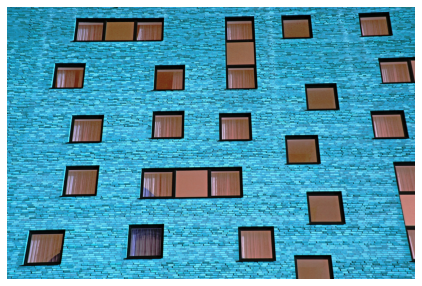

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


size:(1280, 1920)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


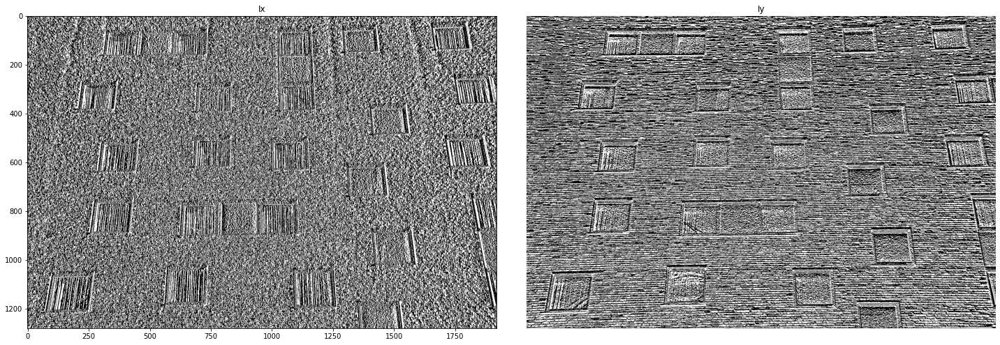

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


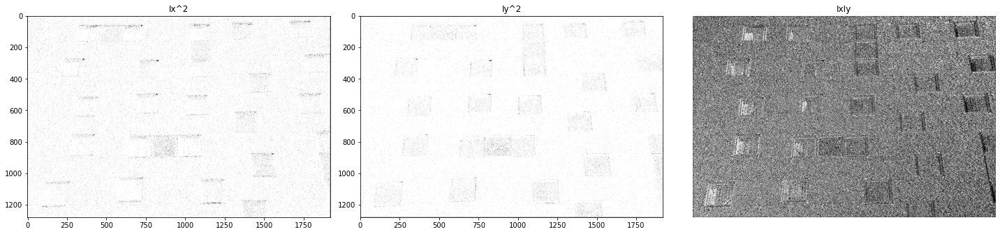

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


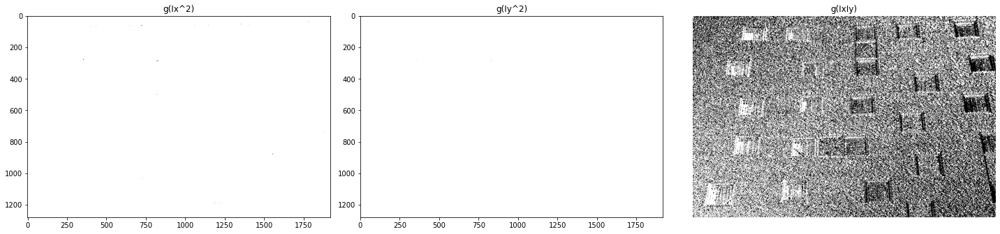

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


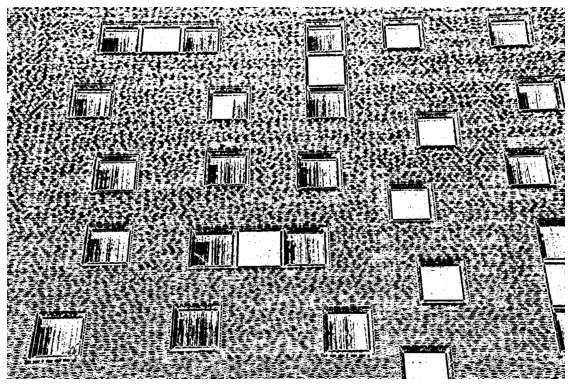

size:(1280, 1920)


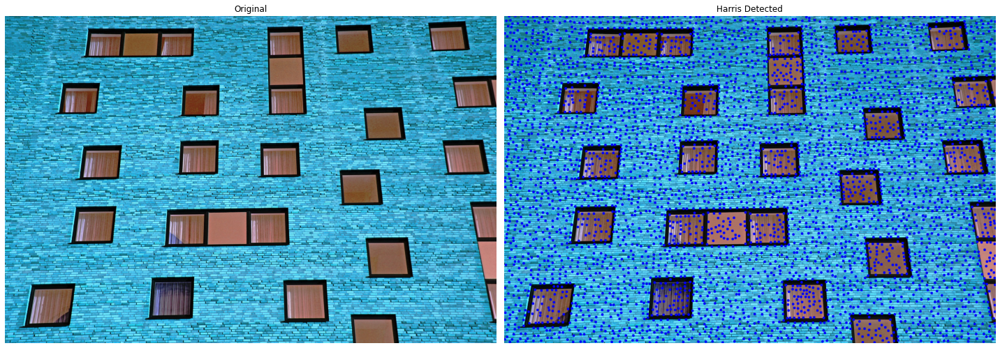

In [3]:

image1 = '/content/drive/My Drive/Colab Notebooks/CV Assignment 2/image_1.jpg'
image2 = '/content/drive/My Drive/Colab Notebooks/CV Assignment 2/image_2.jpg'
# image = 'Assignment/box.jpg'
HarrisCorner(image1)


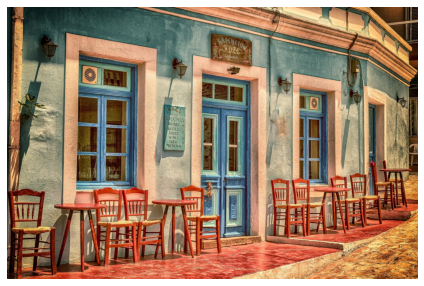

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


size:(1271, 1920)


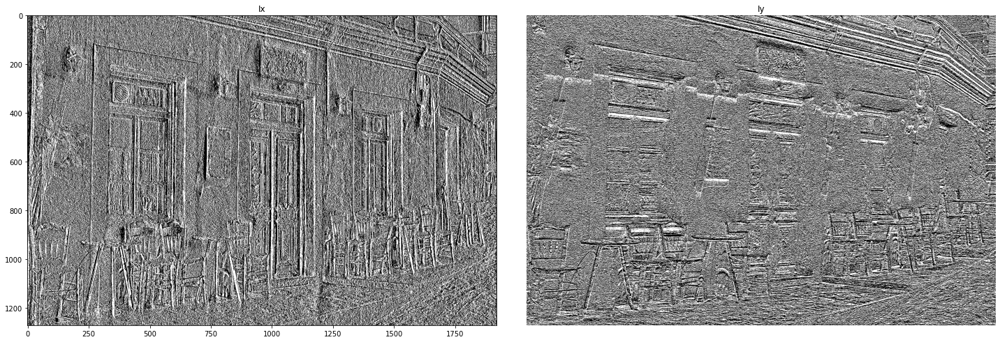

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


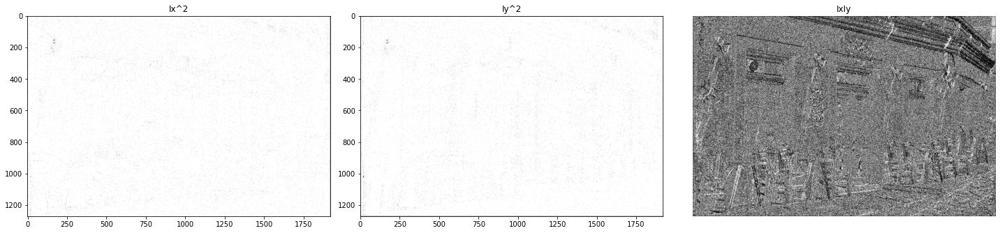

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


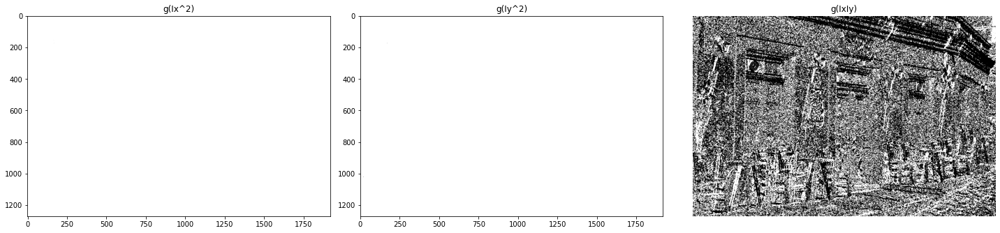

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


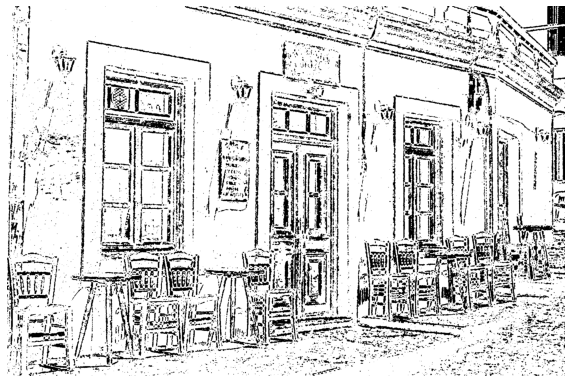

size:(1271, 1920)


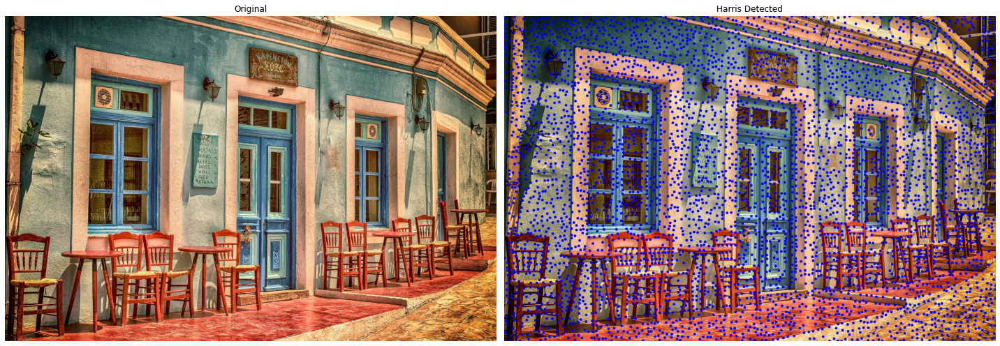

In [4]:
HarrisCorner(image2)

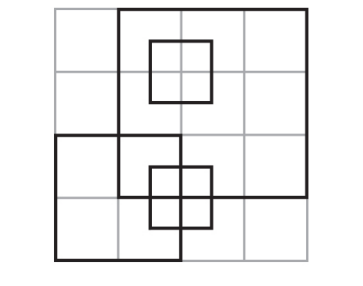

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


size:(353, 454)


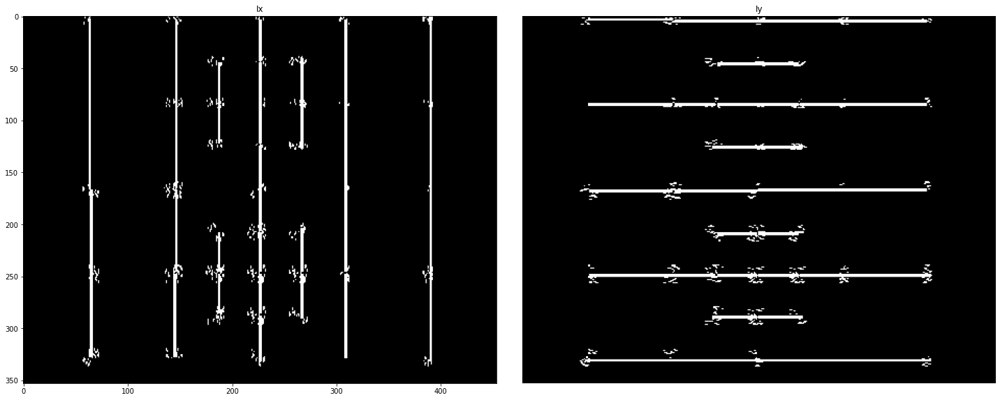

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


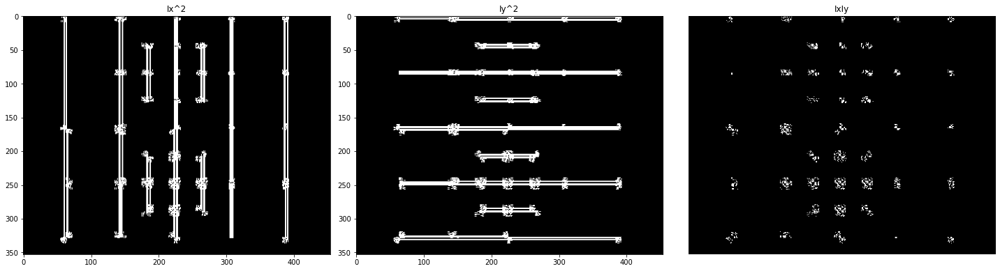

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


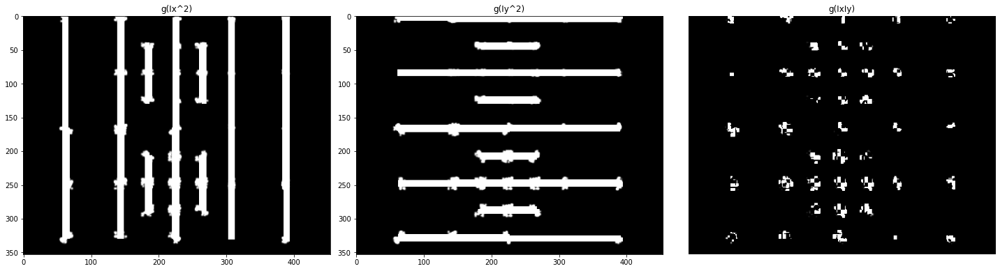

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


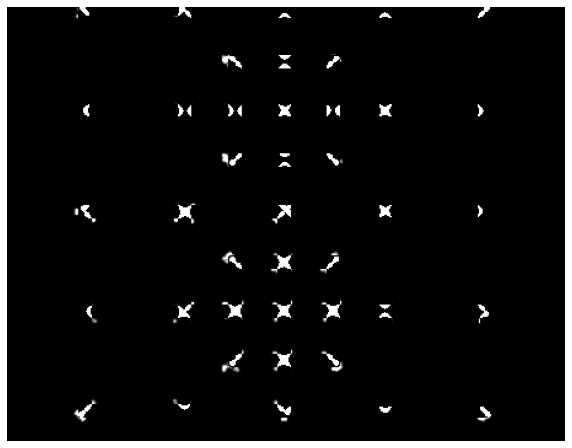

size:(353, 454)


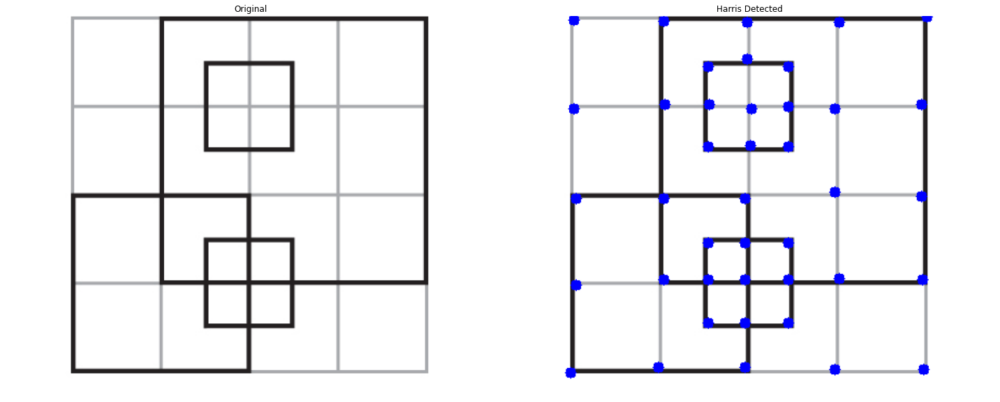

In [5]:
image3 = '/content/drive/My Drive/Colab Notebooks/CV Assignment 2/box.jpg'
HarrisCorner(image3)